In [1]:
import os
os.environ["OMP_NUM_THREADS"] = "1" # export OMP_NUM_THREADS=1
os.environ["OPENBLAS_NUM_THREADS"] = "1" # export OPENBLAS_NUM_THREADS=1
os.environ["MKL_NUM_THREADS"] = "1" # export MKL_NUM_THREADS=1
os.environ["VECLIB_MAXIMUM_THREADS"] = "1" # export VECLIB_MAXIMUM_THREADS=1
os.environ["NUMEXPR_NUM_THREADS"] = "1" # export NUMEXPR_NUM_THREADS=1

import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
import src.fitting as fitting
import src.multielec_utils as mutils
import statsmodels.api as sm
import jax
import jax.numpy as jnp
import multiprocessing as mp
from itertools import product
from matplotlib import collections as matcoll

%matplotlib inline
%load_ext autoreload
%autoreload 2

In [2]:
def activation_probs(x, w):
    # w : site weights, n x d
    # x : current levels, c x d
    site_activations = jnp.dot(w, jnp.transpose(x)) # dimensions: n x c
    p_sites = jax.nn.sigmoid(site_activations) # dimensions : n x c
    p = 1 - jnp.prod(1 - p_sites, 0)  # dimensions: c

    return p

In [3]:
def neg_log_likelihood(w, x, y, trials, l2_reg=0):
    # x : current levels, c x d
    # w : site weights, n x d
    # y : empirical probability for each current level, c
    # trials: number of trials at each current level, c
    # l2_reg: l2 regularization penalty
    # w = w.reshape(-1, x.shape[-1])  # dimensions: n x d
    
    p_model = activation_probs(x, w) # dimensions: c
    p_model = jnp.clip(p_model, a_min=1e-5, a_max=1-1e-5)

    trials = trials.astype(int)
    
    nll = -jnp.sum(trials * y * jnp.log(p_model) + trials * (1 - y) * jnp.log(1 - p_model))

    penalty = l2_reg/2 * jnp.linalg.norm(w)**2

    return nll + penalty

In [4]:
def optimize_w(x, w, y, trials, l2_reg=0, zero_prob=0.01, step_size=0.0001, n_steps=100, wtol=1e-4, step_cnt_decrement=5):

    m = len(w)
    z = 1 - (1 - zero_prob)**(1/m)

    @jax.jit
    def update(x, w, y, trials, l2_reg):
        grads = jax.grad(neg_log_likelihood)(w, x, y, trials, l2_reg=l2_reg)
        return grads

    losses = []
    prev_w = w
    for step in range(n_steps):
        grad = update(x, w, y, trials, l2_reg)
        w = w - step_size * grad
        losses += [neg_log_likelihood(w, x, y, trials, l2_reg=l2_reg)]
        w = w.at[:, 0].set(jnp.minimum(w[:, 0], np.log(z/(1-z))))

        # print(step, jnp.linalg.norm(w - prev_w) / len(w.ravel()), jnp.linalg.norm(grad) / len(w.ravel()))
        if jnp.linalg.norm(w - prev_w) / len(w.ravel()) <= wtol:
            break
        prev_w = w
        
    return losses, w

In [5]:
selectivities_full = np.load('selectivities_full.npy').tolist()
selectivities_active = np.load('selectivities_active.npy').tolist()
datasets = np.load('datasets.npy', allow_pickle=True).tolist()

In [29]:
plt.close('all')

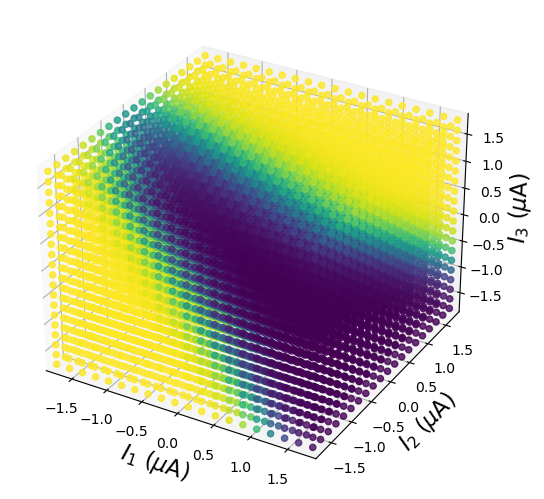

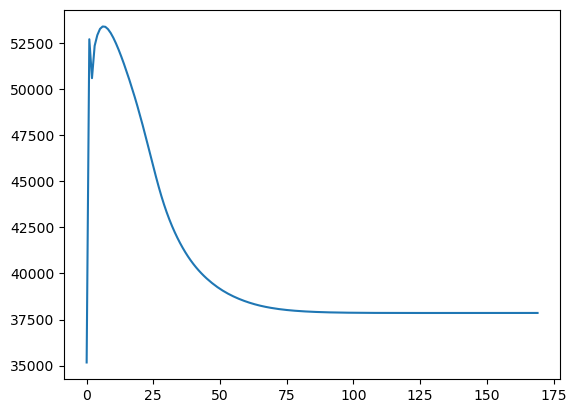

-0.07056582


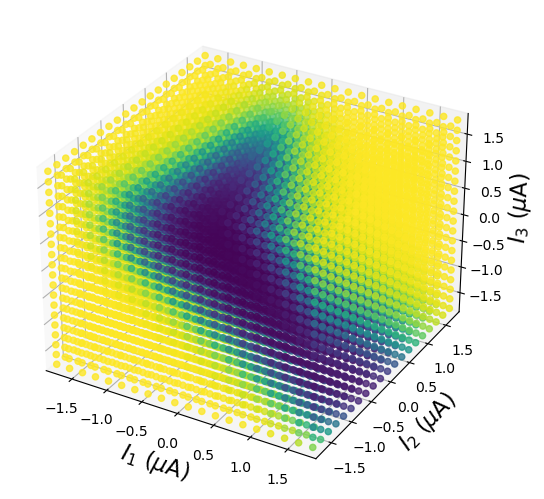

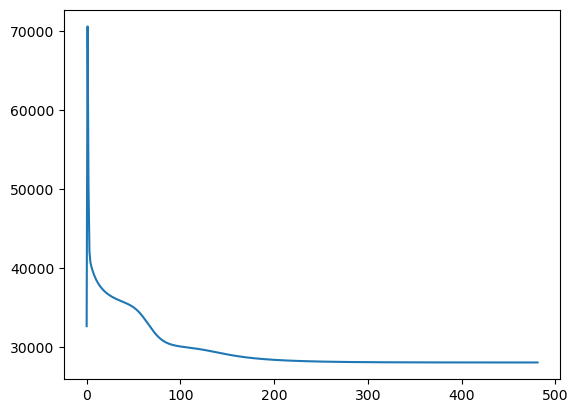

0.20757955


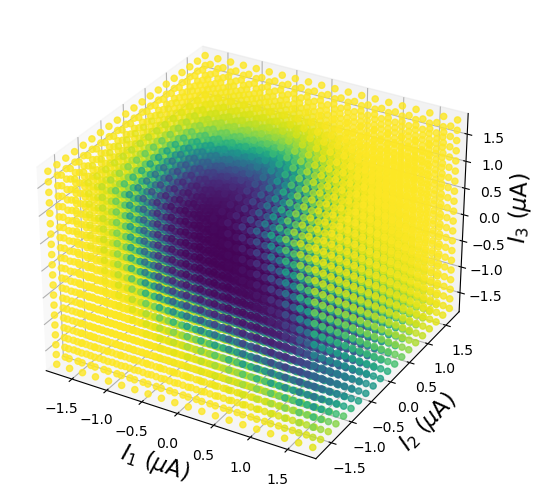

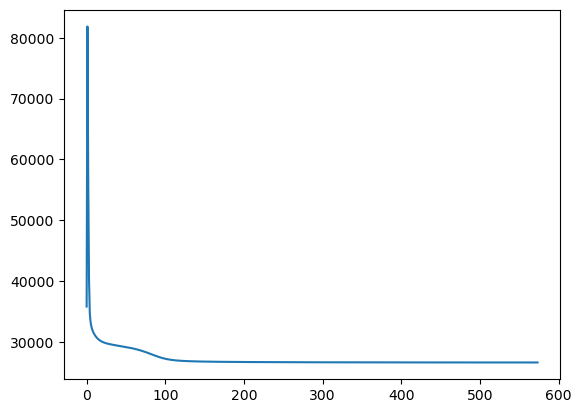

0.24756372


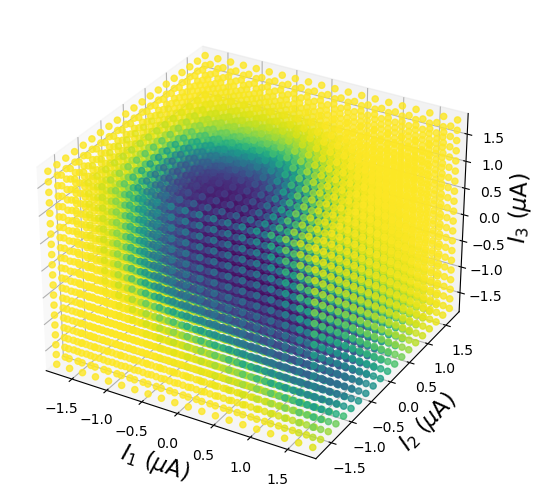

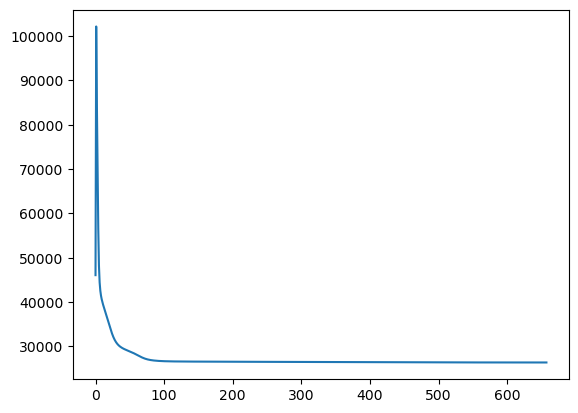

0.25384736
[[-5.985187    5.3963675   2.041932    1.9080712 ]
 [-5.985187   -5.774713   -1.4947407  -0.23705083]
 [-5.985187   -2.1406143  -2.8848553  -4.3050017 ]
 [-5.985187   -0.516705    2.809342    3.7700295 ]]


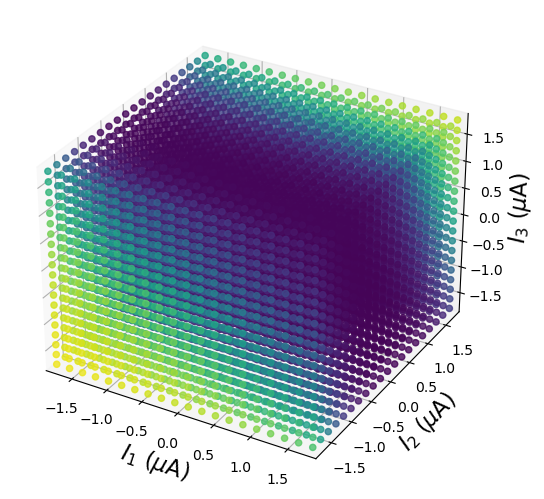

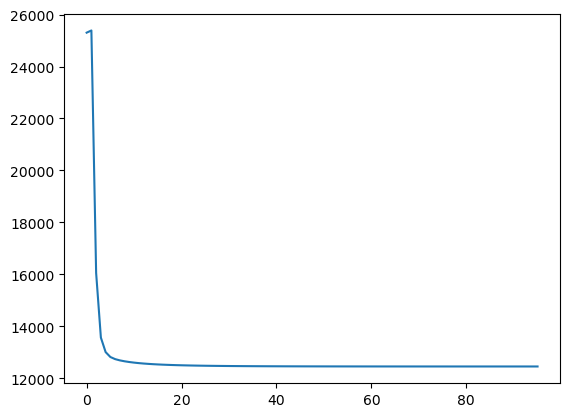

0.29374403


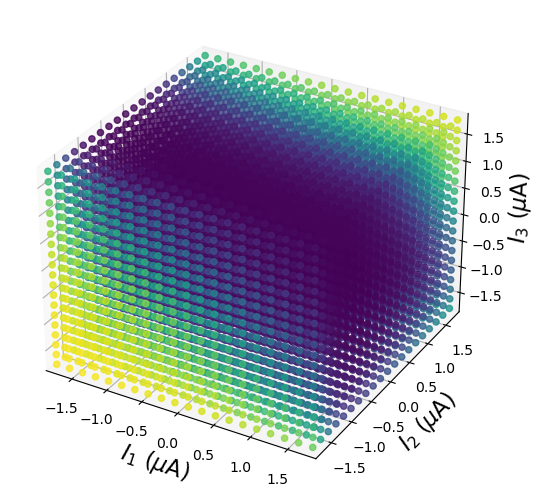

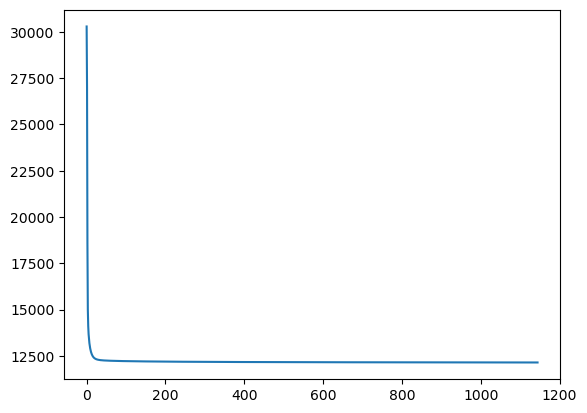

0.31102198
[[-5.290783   -0.76719713 -3.3122108  -0.9368735 ]
 [-5.290783    0.54958034  2.647172    1.0880166 ]]


In [30]:
# Path definitions
ANALYSIS_BASE = "/Volumes/Analysis"
MATFILE_BASE = "/Volumes/Scratch/Users/praful/triplet_gsort_matfiles_20220420"
gsort_path = None

dataset = "2020-10-06-7"
estim = "data003/data003-all"
wnoise = "kilosort_data000/data000"
electrical_path = os.path.join(ANALYSIS_BASE, dataset, estim)
vis_datapath = os.path.join(ANALYSIS_BASE, dataset, wnoise)

ms = [2, 3, 4, 5]
l2_reg = 0.01
w_step_size = 0.0001
R2_thresh = 0.03

p = 2
cells = np.array([259, 292])

ws = []
for cell in cells:

    X_expt_orig, probs_orig, T_orig = mutils.loadNewLVData(electrical_path, gsort_path, dataset, estim, wnoise, p, cell,
                                            load_from_mat=True, 
                                            MATFILE_BASE=MATFILE_BASE)

    X_all = jnp.array(sm.add_constant(mutils.get_stim_amps_newlv(electrical_path, p), has_constant='add'))
    X_expt, probs, T = mutils.triplet_cleaning(X_expt_orig, probs_orig, T_orig, electrical_path, p)

    w_inits = []
    for m in ms:
        w_init = jnp.array(np.random.normal(size=(m, X_all.shape[1])))
        w_inits.append(w_init)

    ybar = np.sum(probs * T) / np.sum(T)
    beta_null = np.log(ybar / (1 - ybar))
    null_weights = jnp.array(np.concatenate((np.array([beta_null]), np.zeros(X_expt.shape[-1]))))

    X = jnp.array(sm.add_constant(X_expt, has_constant='add'))
    probs = jnp.array(probs)
    T = jnp.array(T)
    nll_null = neg_log_likelihood(null_weights[None, :], X, probs, T, l2_reg=l2_reg)

    # weights_BIC = []
    # BICs = []
    # Optimize w
    for i in range(len(ms)):
        losses, w_final = optimize_w(X, w_inits[i], probs, T, l2_reg=l2_reg, step_size=w_step_size, n_steps=3500)
        p_pred = activation_probs(X_all, w_final)

        # BICs.append(len(w_final.ravel()) * jnp.log(len(X)) + 2 * losses[-1])
        # weights_BIC.append(w_final)

        fig = plt.figure()
        fig.clear()
        ax = Axes3D(fig, auto_add_to_figure=False)
        fig.add_axes(ax)
        plt.xlabel(r'$I_1$ ($\mu$A)', fontsize=16)
        plt.ylabel(r'$I_2$ ($\mu$A)', fontsize=16)
        plt.xlim(-1.8, 1.8)
        plt.ylim(-1.8, 1.8)
        ax.set_zlim(-1.8, 1.8)
        ax.set_zlabel(r'$I_3$ ($\mu$A)', fontsize=16)

        scat = ax.scatter(X_all[:, 1], 
                    X_all[:, 2],
                    X_all[:, 3], marker='o', c=p_pred, s=20, alpha=0.8, vmin=0, vmax=1)

        plt.show()

        plt.figure()
        plt.plot(losses)
        plt.show()

        print(1 - losses[-1] / nll_null)
        
        if i == 0:
            last_R2 = 1 - losses[-1] / nll_null
            last_opt = w_final

        else:
            new_R2 = 1 - losses[-1] / nll_null
            if new_R2 - last_R2 <= R2_thresh:
                break
            else:
                last_R2 = new_R2
                last_opt = w_final

    print(last_opt)
    # w_final = weights_BIC[jnp.argmin(jnp.array(BICs))]
    # print(jnp.array(BICs), w_final)

    ws.append(last_opt)

X_expt_orig = mutils.get_stim_amps_newlv(electrical_path, p)
w_true_t = ws[0]
w_true_nt = ws[1]

X = jnp.array(sm.add_constant(X_expt_orig, has_constant='add'))
p_true_t = activation_probs(X, w_true_t) # prob with each current level
p_true_nt = activation_probs(X, w_true_nt) # prob with each current level

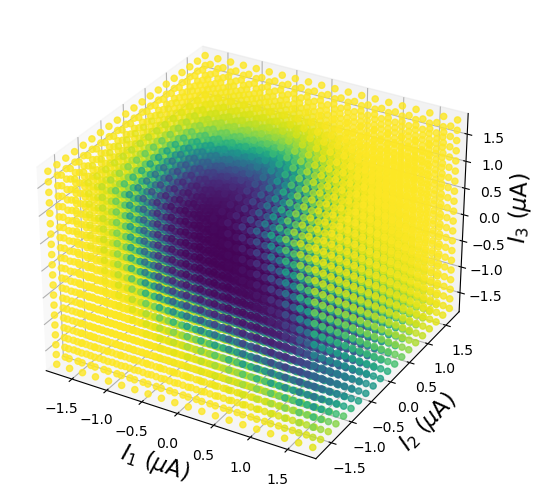

In [31]:
fig = plt.figure()
fig.clear()
ax = Axes3D(fig, auto_add_to_figure=False)
fig.add_axes(ax)
plt.xlabel(r'$I_1$ ($\mu$A)', fontsize=16)
plt.ylabel(r'$I_2$ ($\mu$A)', fontsize=16)
plt.xlim(-1.8, 1.8)
plt.ylim(-1.8, 1.8)
ax.set_zlim(-1.8, 1.8)
ax.set_zlabel(r'$I_3$ ($\mu$A)', fontsize=16)

scat = ax.scatter(X_expt_orig[:, 0], 
            X_expt_orig[:, 1],
            X_expt_orig[:, 2], marker='o', c=p_true_t, s=20, alpha=0.8, vmin=0, vmax=1)

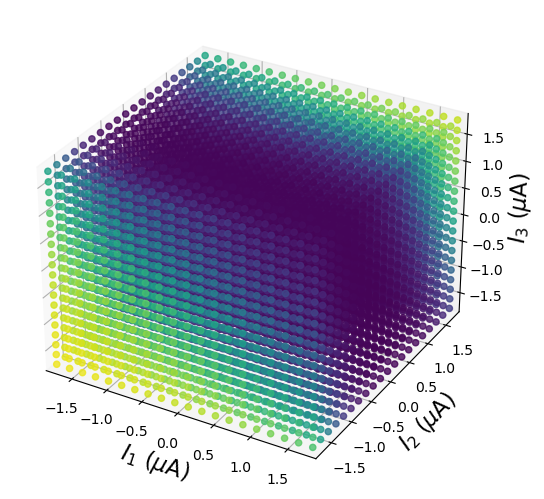

In [32]:
fig = plt.figure()
fig.clear()
ax = Axes3D(fig, auto_add_to_figure=False)
fig.add_axes(ax)
plt.xlabel(r'$I_1$ ($\mu$A)', fontsize=16)
plt.ylabel(r'$I_2$ ($\mu$A)', fontsize=16)
plt.xlim(-1.8, 1.8)
plt.ylim(-1.8, 1.8)
ax.set_zlim(-1.8, 1.8)
ax.set_zlabel(r'$I_3$ ($\mu$A)', fontsize=16)

scat = ax.scatter(X_expt_orig[:, 0], 
            X_expt_orig[:, 1],
            X_expt_orig[:, 2], marker='o', c=p_true_nt, s=20, alpha=0.8, vmin=0, vmax=1)

In [33]:
def sample_spikes(p_true, t):
    p_true, t = np.array(p_true), np.array(t).astype(int)
    
    p_empirical = []
    for i in range(len(p_true)):
        if t[i] == 0:
            p_empirical += [0.5]
        
        else:
            p_empirical += [np.mean(np.random.choice(np.array([0, 1]), 
                                                 p=np.array([1-p_true[i], p_true[i]]), 
                                                 size=t[i]))]
        
    return p_empirical

In [34]:
def fisher_info(x, w, t):
    # x : current levels, c x d
    # w : site weights, n x d
    # y : empirical probability for each current level, c
    # t: number of trials for each current level, c
    
    p_model = jnp.clip(activation_probs(x, w), a_min=1e-5, a_max=1-1e-5) # c
    I_p = jnp.diag(t / (p_model * (1 - p_model)))   # c x c
    J = jax.jacfwd(activation_probs, argnums=1)(x, w).reshape((len(x), w.shape[0]*w.shape[1]))
    I_w = jnp.dot(jnp.dot(J.T, I_p), J) / len(x)
    
    loss = jnp.trace(J @ (jnp.linalg.inv(I_w) @ J.T))
    # sign, logdet = jnp.linalg.slogdet(I_w)
    # loss = -sign * logdet
    return loss

In [35]:
def optimize_fisher(x, w_t, w_nt, t_prev, t, reg=0, step_size=0.001, n_steps=100, reltol=-np.inf, T_budget=5000, step_cnt_decrement=5):

    @jax.jit
    def update(x, w_t, w_nt, t_prev, t):
        fisher_lambda = lambda t, x, w_t, w_nt, t_prev: fisher_info(x, w_t, t_prev + jnp.absolute(t)) + fisher_info(x, w_nt, t_prev + jnp.absolute(t)) + reg * jnp.absolute(jnp.sum(jnp.absolute(t)) - T_budget)
        grads = jax.grad(fisher_lambda)(t, x, w_t, w_nt, t_prev)

        return grads
    
    losses = []
    for step in range(n_steps):
        grad = update(x, w_t, w_nt, t_prev, t)
        t = t - step_size * grad
    
        losses += [[fisher_info(x, w_t, t_prev + jnp.absolute(t)) + fisher_info(x, w_nt, t_prev + jnp.absolute(t)), 
                    jnp.sum(jnp.absolute(t)),
                    fisher_info(x, w_t, t_prev + jnp.absolute(t)) + fisher_info(x, w_nt, t_prev + jnp.absolute(t)) + reg * jnp.absolute(jnp.sum(jnp.absolute(t)) - T_budget)]]
        
        if step % step_cnt_decrement == 0:
            step_size = step_size * 0.95

    return np.array(losses), t

In [36]:
def get_performance_AL(X, w_meas, p_true):
    probs_pred = activation_probs(X, w_meas)
    RMSE = jnp.sqrt(jnp.sum((probs_pred - p_true)**2) / len(X))

    return RMSE

In [37]:
def roundSum(test_in):

    running_total = 0
    running_int_total = 0

    sorted_inds = np.argsort(test_in)
    out = np.zeros(len(test_in))
    for i in sorted_inds:
        val = np.round(test_in[i] + running_total) - running_int_total
        
        out[i] = val
        running_total += test_in[i]
        running_int_total += val

    return out

Restart 1


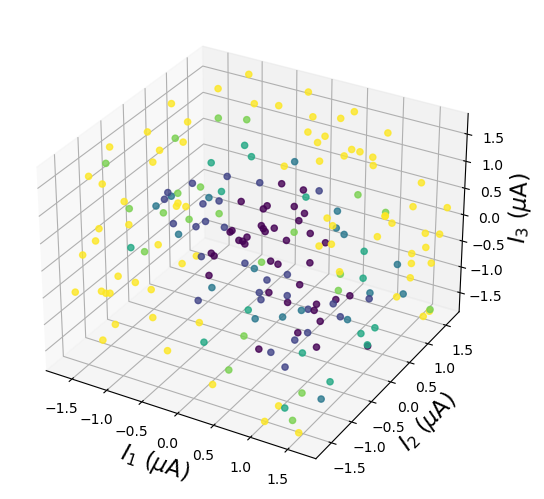

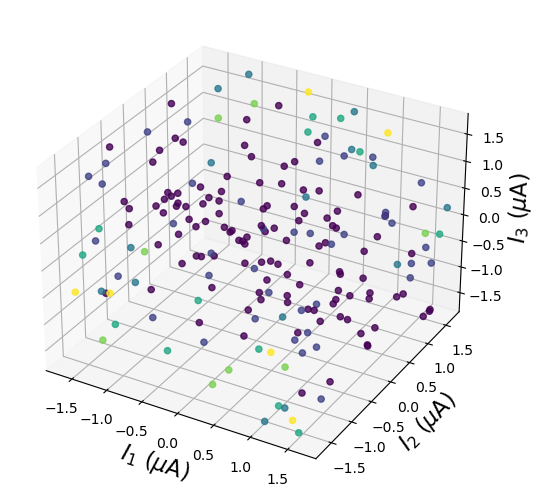

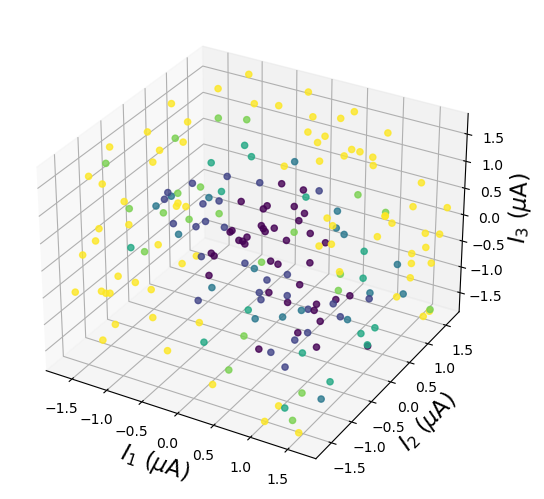

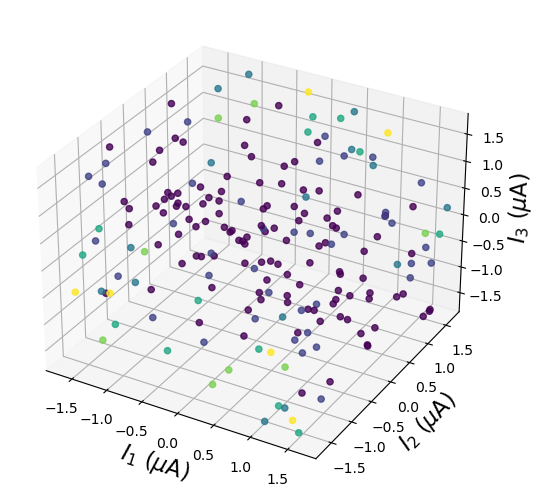

[[-5.985187   -1.564092   -2.467875   -4.233738  ]
 [-5.985187   -6.146963   -2.1362596  -0.8411048 ]
 [-6.1582685   5.341195    1.8687717   1.6525155 ]
 [-5.985187    0.19941483  3.346905    3.923453  ]]
[[-5.3175335  0.4673009  2.636141   1.1135207]
 [-5.2983613 -0.601004  -3.4119332 -0.7395934]]
[[-5.985187   -1.564092   -2.467875   -4.233738  ]
 [-5.985187   -6.146963   -2.1362596  -0.8411048 ]
 [-6.1582685   5.341195    1.8687717   1.6525155 ]
 [-5.985187    0.19941483  3.346905    3.923453  ]]
[[-5.3175335  0.4673009  2.636141   1.1135207]
 [-5.2983613 -0.601004  -3.4119332 -0.7395934]]
0.041513015 0.041513015
0.027509453 0.027509453




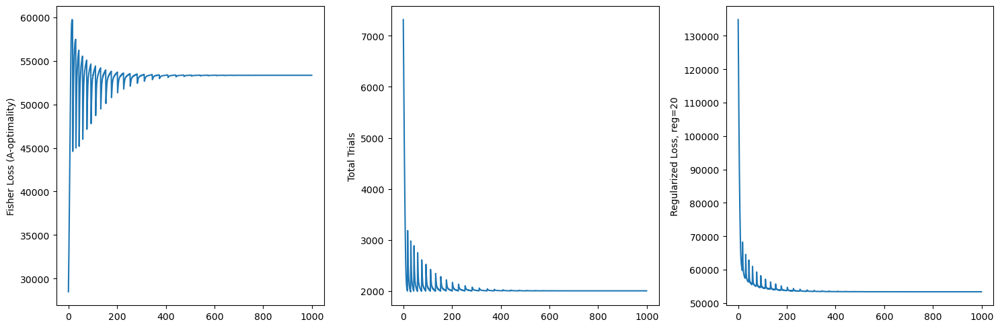

1939.0


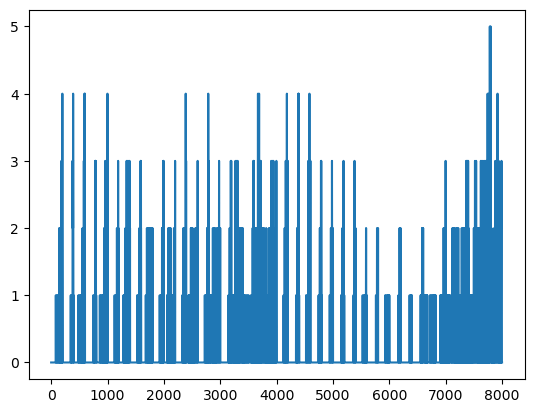

2000.0


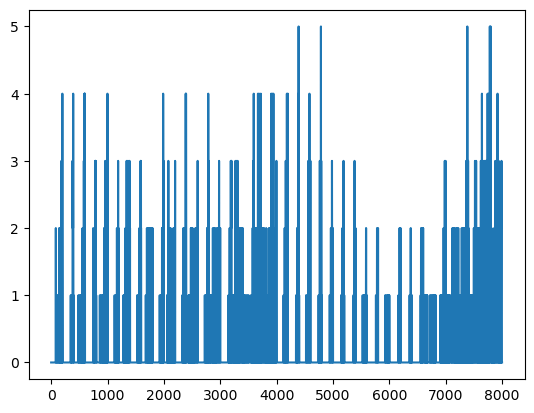

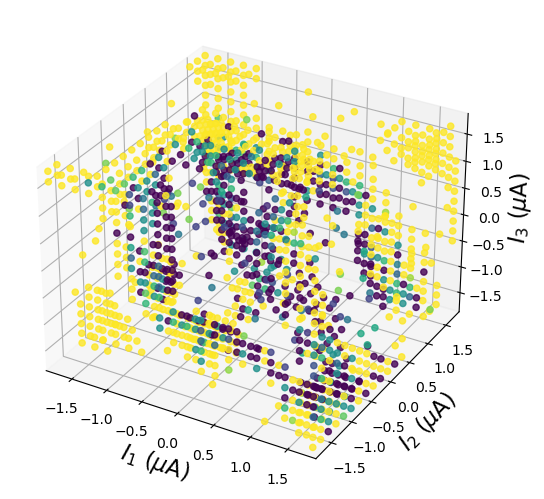

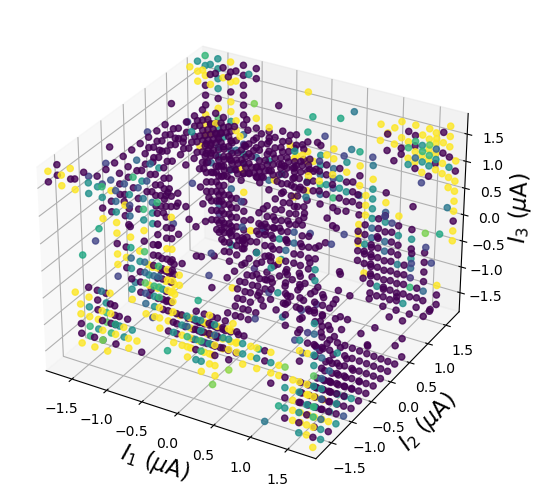

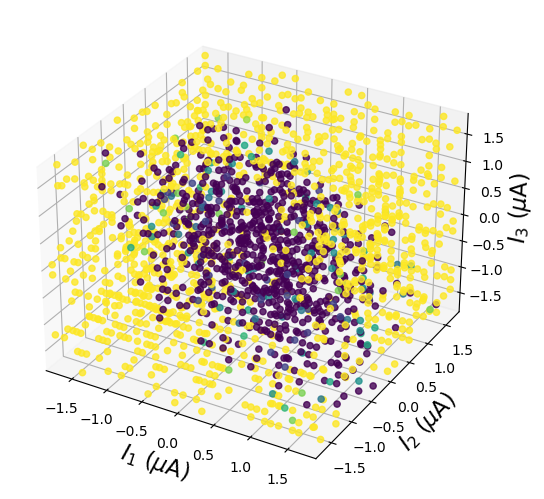

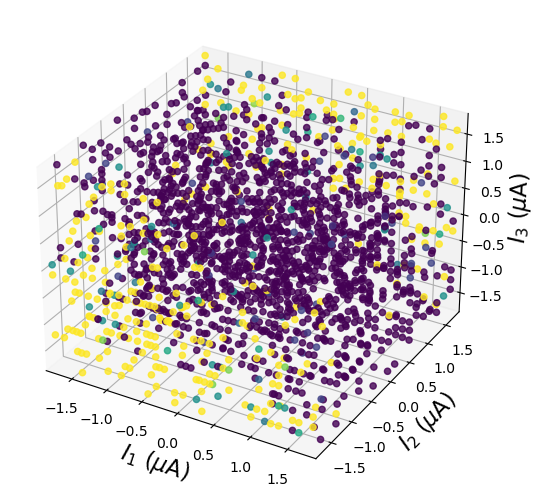

[[-5.985187   -2.4134676  -2.9157064  -4.3255787 ]
 [-6.1676874  -5.8775573  -1.6939594  -0.28331462]
 [-6.1415734   5.587068    2.0305486   1.8625573 ]
 [-6.1113324  -0.6698563   2.9661994   3.9957495 ]]
[[-5.290783    0.56372195  2.6144798   1.205912  ]
 [-5.290783   -0.68289447 -3.226406   -0.9357081 ]]
[[-5.985187   -2.0374098  -2.7293892  -4.3896585 ]
 [-5.985187   -5.821976   -1.7010531  -0.5154205 ]
 [-5.9973693   5.2701488   2.0924163   1.7150918 ]
 [-5.985187   -0.13611121  3.0420995   4.041198  ]]
[[-5.290783    0.43573087  2.6690342   1.120528  ]
 [-5.4219027  -0.8100796  -3.5045838  -0.85704124]]
0.019498732 0.02750192
0.018112464 0.020127092




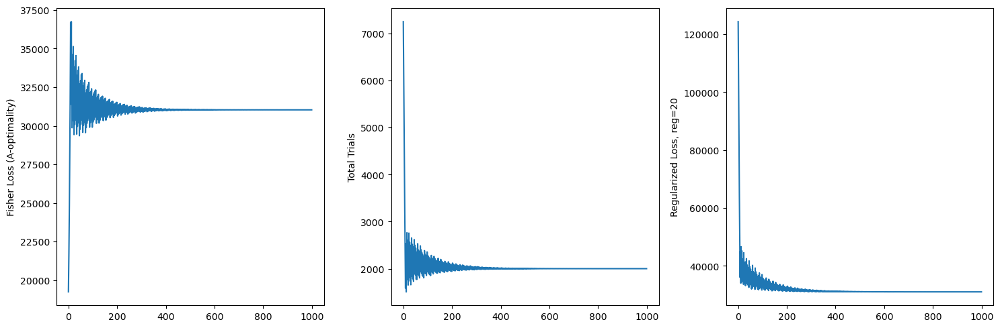

1674.0


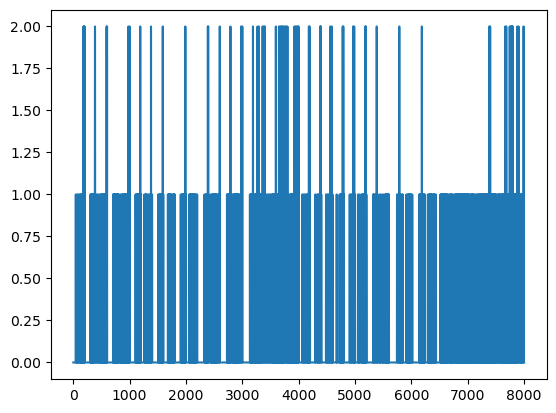

2000.0


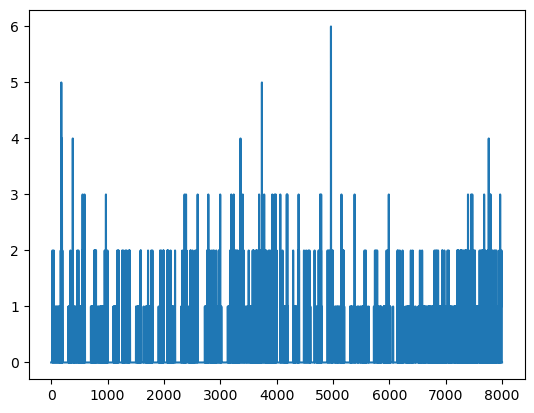

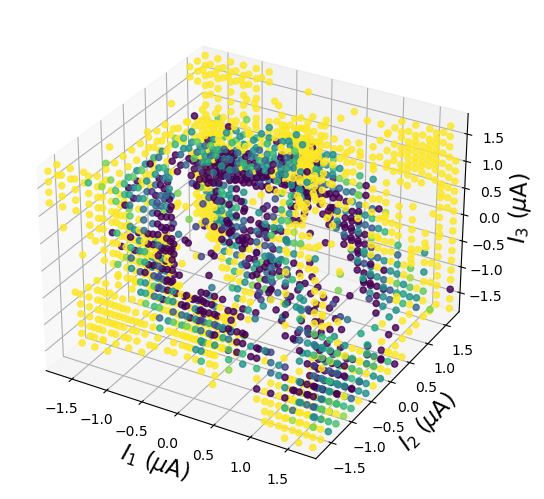

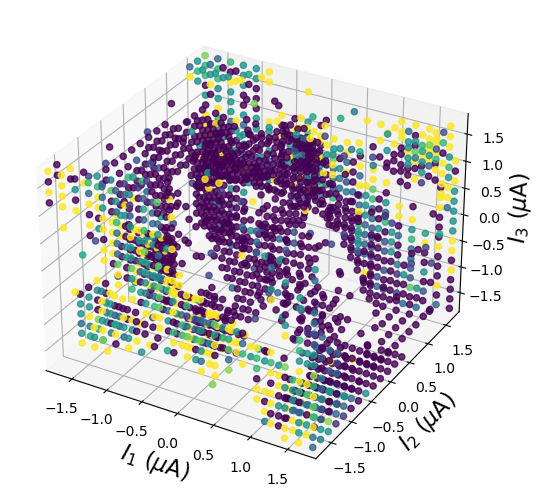

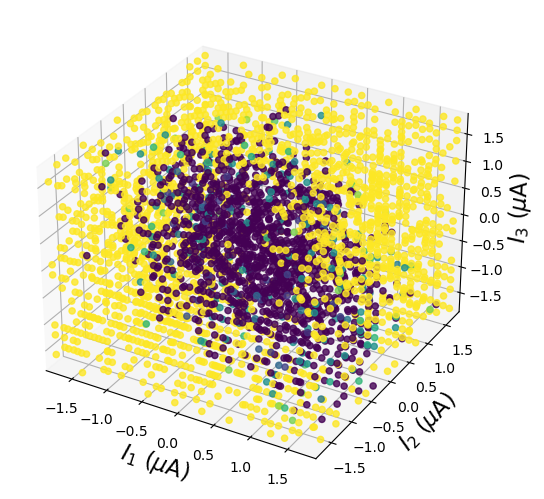

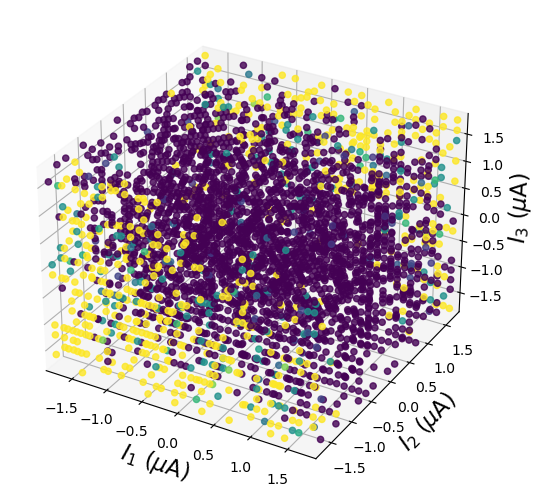

[[-5.986279   -2.358177   -2.8873286  -4.428097  ]
 [-6.055165   -5.9078474  -1.5787156  -0.19251353]
 [-6.1267858   5.5843143   1.9592708   1.8388819 ]
 [-6.1237226  -0.5622003   2.9767885   3.8779771 ]]
[[-5.290783    0.5760987   2.665469    1.1083617 ]
 [-5.290783   -0.64491355 -3.255775   -0.88594043]]
[[-5.985187   -2.0392616  -2.7464123  -4.3705664 ]
 [-5.985187   -5.740538   -1.6037706  -0.34549823]
 [-5.985187    5.305025    2.0944748   1.7947768 ]
 [-5.985187   -0.1965197   2.9613795   3.9007375 ]]
[[-5.290783    0.5145255   2.6825876   1.0407752 ]
 [-5.412479   -0.7550073  -3.4666617  -0.86957544]]
0.01854166 0.019128747
0.01732135 0.012791418




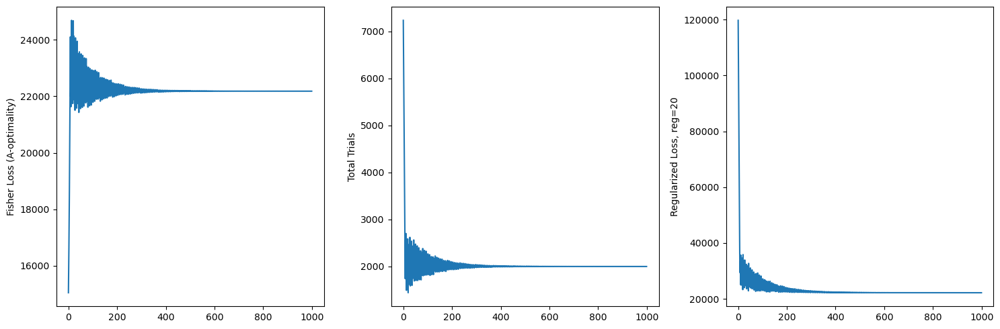

1193.0


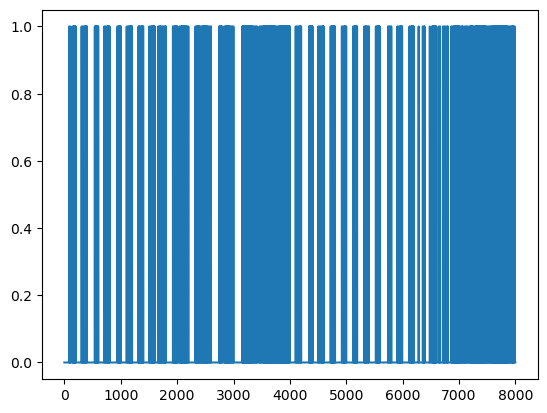

2000.0


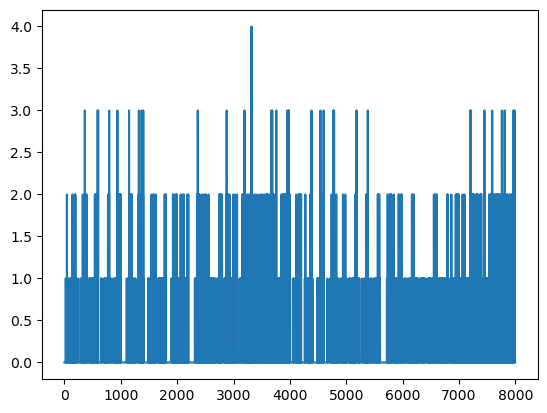

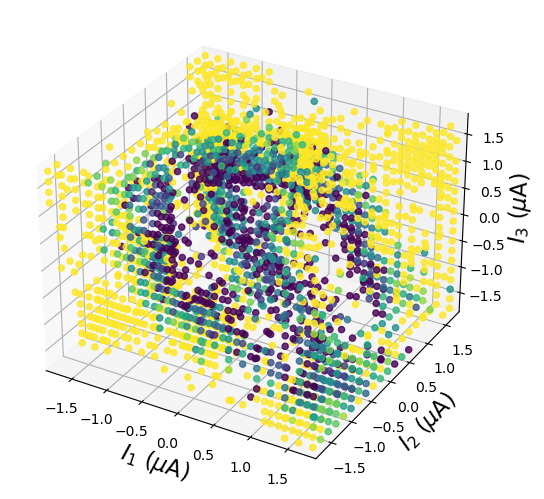

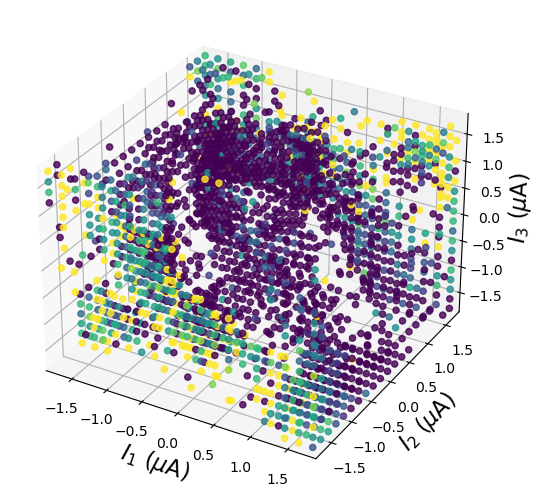

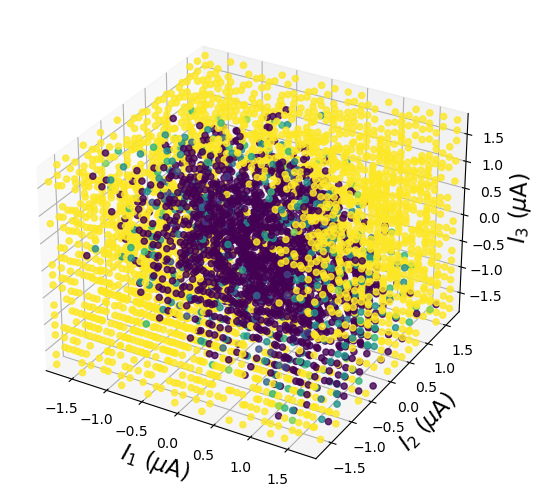

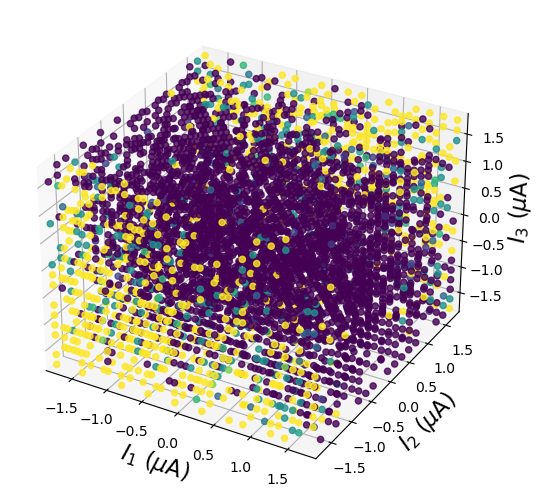

[[-5.985187  -2.271385  -2.900224  -4.3997474]
 [-5.985187  -5.7984114 -1.5051979 -0.1512203]
 [-6.18217    5.6615806  2.0851507  1.9370383]
 [-5.985187  -0.5226932  2.8602471  3.8066044]]
[[-5.304943    0.5585657   2.6605678   1.0781052 ]
 [-5.290783   -0.6850129  -3.2850816  -0.90255487]]
[[-5.985187   -2.043141   -2.7473633  -4.388692  ]
 [-5.985187   -5.6980343  -1.5707434  -0.38189185]
 [-5.9891014   5.3327017   2.1380236   1.8798951 ]
 [-5.9884763  -0.18203321  2.8901618   3.9311173 ]]
[[-5.290783   0.5192774  2.6312094  1.1065218]
 [-5.3566966 -0.7472286 -3.4188392 -0.9056649]]
0.0131979445 0.020393189
0.010382633 0.0094207395




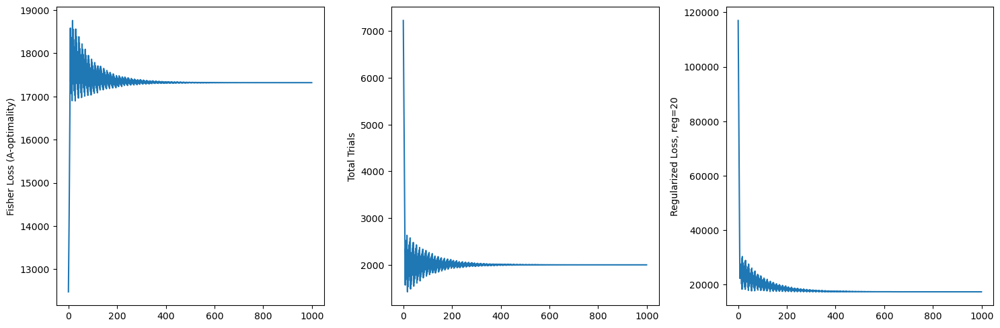

647.0


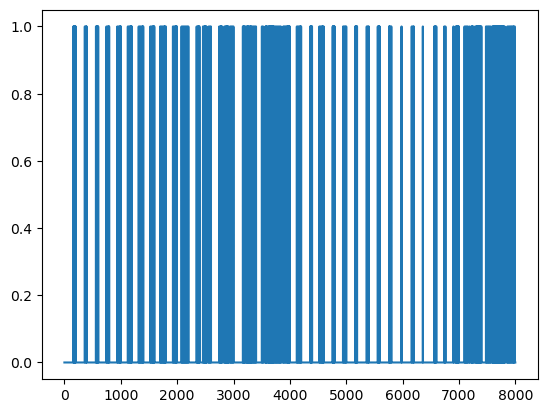

2000.0


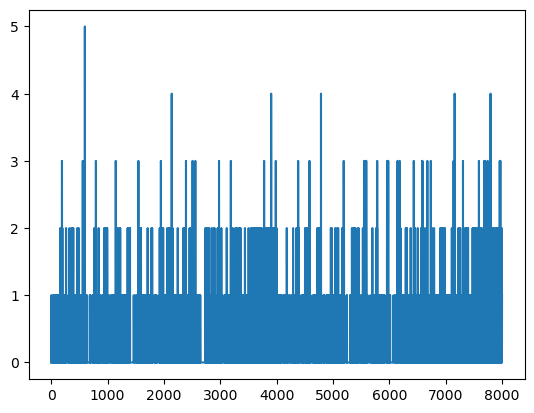

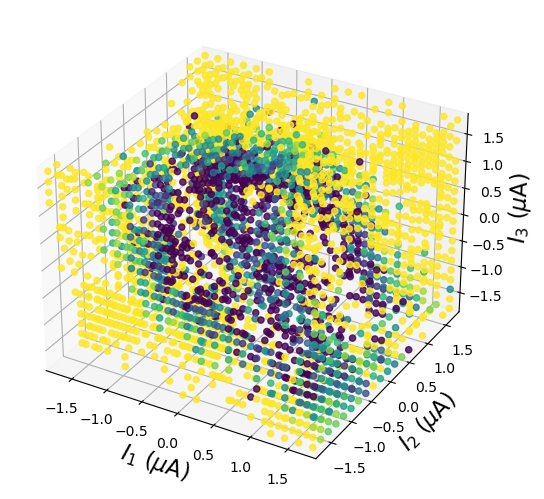

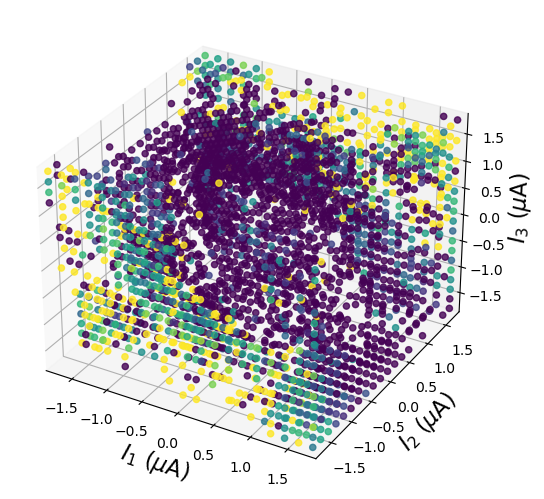

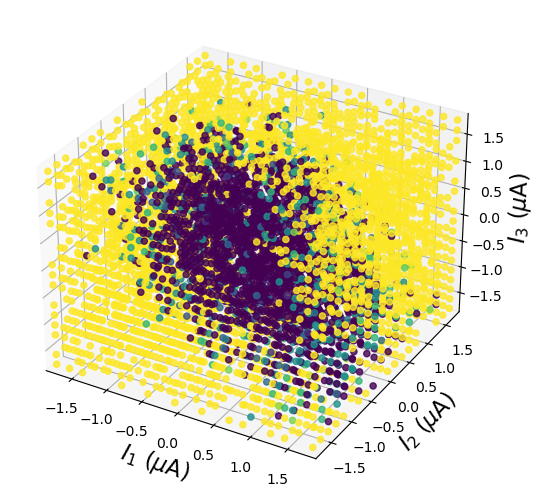

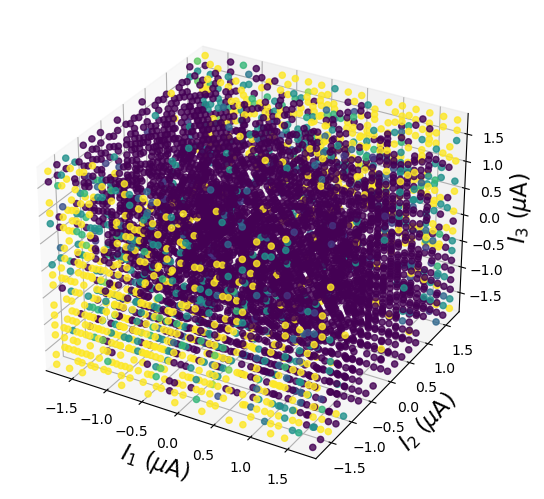

[[-5.985187   -2.286824   -2.9338725  -4.4258137 ]
 [-5.985187   -5.751627   -1.4962479  -0.18975334]
 [-6.1998687   5.651349    2.090028    1.8897539 ]
 [-5.985187   -0.49256706  2.8384542   3.8355532 ]]
[[-5.31376     0.5423692   2.6738775   1.065997  ]
 [-5.290783   -0.6930842  -3.2715049  -0.88109744]]
[[-5.985187   -2.0815768  -2.8535273  -4.372521  ]
 [-5.985187   -5.7019444  -1.6409994  -0.45792663]
 [-6.0342107   5.3778768   2.2280483   1.9587914 ]
 [-6.0081253  -0.3192341   2.8898466   3.895413  ]]
[[-5.290783    0.5004137   2.6880977   1.0857131 ]
 [-5.3182454  -0.75334877 -3.393674   -0.9165701 ]]
0.013143362 0.02096031
0.011915333 0.010149637




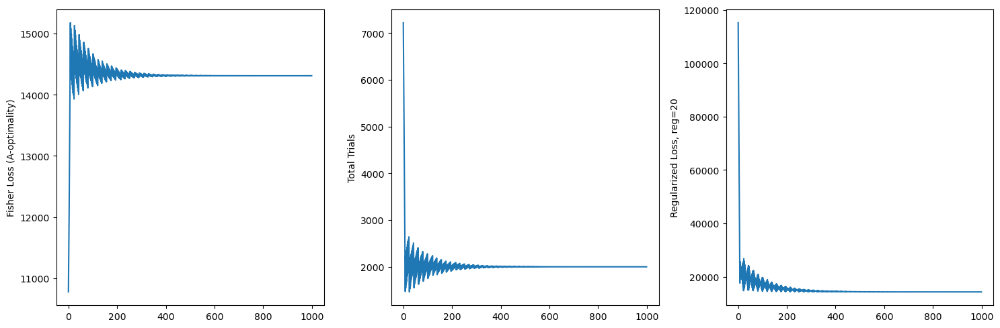

257.0


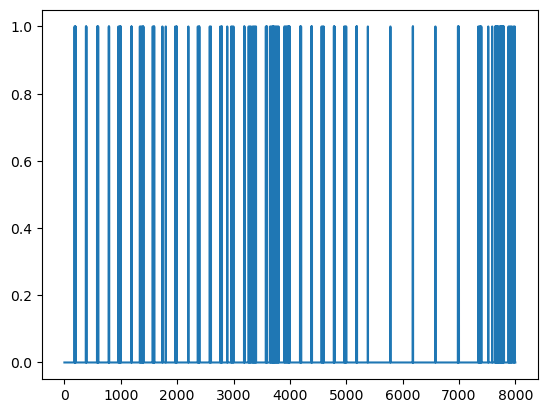

2000.0


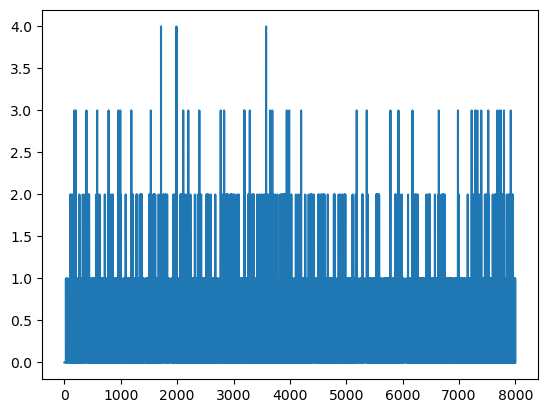

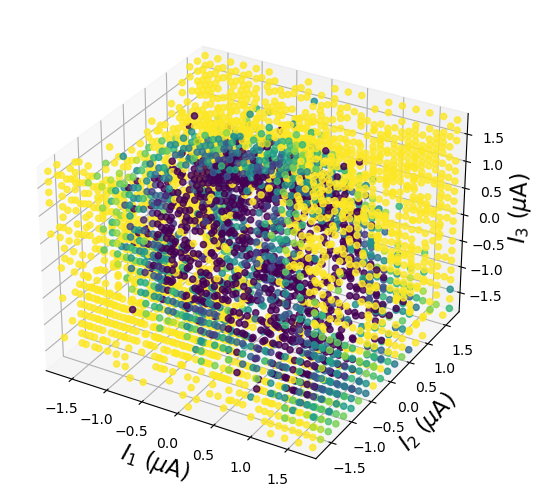

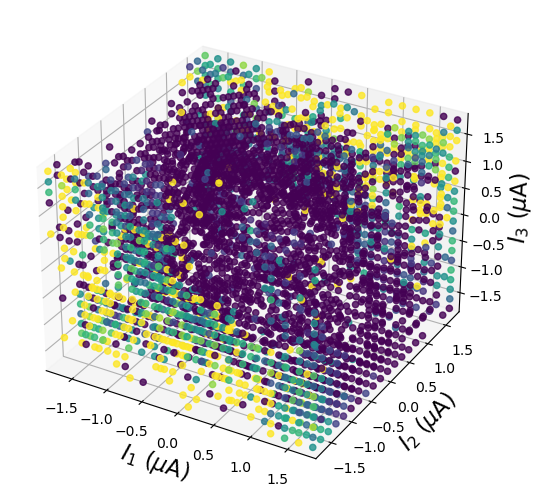

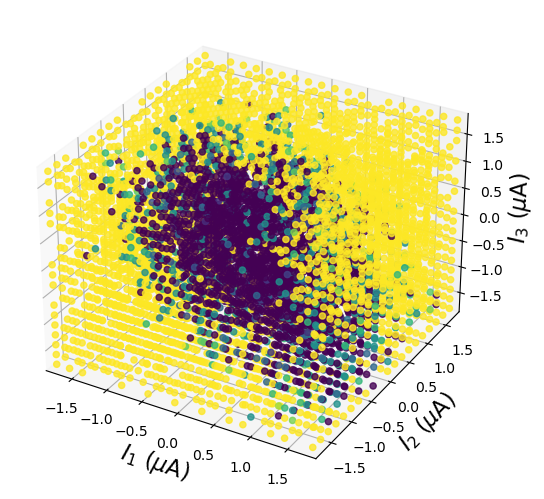

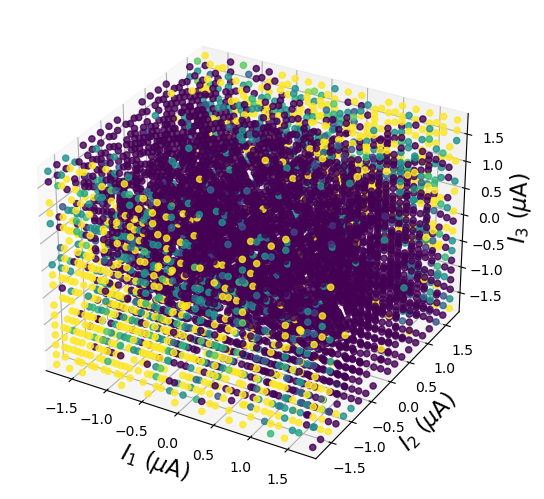

[[-5.985187   -2.252153   -2.9361725  -4.4080186 ]
 [-5.985187   -5.7791553  -1.4437355  -0.10770118]
 [-6.2309794   5.66838     2.1222072   1.9364643 ]
 [-6.024592   -0.44679657  2.8609312   3.818568  ]]
[[-5.697086   -0.7534383  -3.527988   -0.9506587 ]
 [-6.020503   -0.05409608  1.7380593   0.51673937]
 [-5.697086    0.6346573   2.7956147   1.1376561 ]]
[[-5.985187  -2.101346  -2.8450334 -4.334748 ]
 [-5.985187  -5.7393336 -1.6435385 -0.4671147]
 [-6.026024   5.4036846  2.1627212  1.964327 ]
 [-5.9916663 -0.3481173  2.8835506  3.9463782]]
[[-5.290783    0.49439904  2.6792085   1.0882429 ]
 [-5.290783   -0.74945396 -3.3623433  -0.90019065]]
0.010773062 0.0163073
0.013606964 0.009002319




In [38]:
%matplotlib inline

total_budget = 10000
num_iters = 5
budget = int(total_budget / num_iters)
reg = 20    #np.flip(np.logspace(-5, 3, 100000, base=2))
num_restarts = 1
w_step_size = 0.001
T_step_size = 0.005

init_size = 200
init_trials = 5

performance_stack_t = []
performance_stack_nt = []
performance_stack_random_t = []
performance_stack_random_nt = []
num_samples_stack = []

for restart in range(num_restarts):
    print('Restart', restart + 1)
    # Initialize amplitudes
    init_inds = np.random.choice(len(X), replace=False, size=init_size)

    # Initialize trials
    T_prev = jnp.zeros(len(X_expt_orig))
    T_prev = T_prev.at[init_inds].set(init_trials)
    T_prev_random = jnp.copy(T_prev)

    p_empirical_t = jnp.array(sample_spikes(p_true_t, T_prev))
    p_empirical_nt = jnp.array(sample_spikes(p_true_nt, T_prev))

    p_empirical_random_t = jnp.copy(p_empirical_t)
    p_empirical_random_nt = jnp.copy(p_empirical_nt)

    # Initialize weights

    w_inits_t = []
    for m in ms:
        w_init_t = jnp.array(np.random.normal(size=(m, X.shape[1])))
        w_inits_t.append(w_init_t)

    w_inits_nt = []
    for m in ms:
        w_init_nt = jnp.array(np.random.normal(size=(m, X.shape[1])))
        w_inits_nt.append(w_init_nt)

    w_inits_random_t = w_inits_t.copy()
    w_inits_random_nt = w_inits_nt.copy()

    performances_t = []
    performances_nt = []
    performances_random_t = []
    performances_random_nt = []
    num_samples = []

    cnt = 0

    while True:
        num_samples.append(np.sum(np.absolute(np.array(T_prev)).astype(int)))
        sampled_inds = np.where(np.absolute(np.array(T_prev)).astype(int) > 0)[0]

        fig = plt.figure()
        fig.clear()
        ax = Axes3D(fig, auto_add_to_figure=False)
        fig.add_axes(ax)
        plt.xlabel(r'$I_1$ ($\mu$A)', fontsize=16)
        plt.ylabel(r'$I_2$ ($\mu$A)', fontsize=16)
        plt.xlim(-1.8, 1.8)
        plt.ylim(-1.8, 1.8)
        ax.set_zlim(-1.8, 1.8)
        ax.set_zlabel(r'$I_3$ ($\mu$A)', fontsize=16)

        scat = ax.scatter(X_expt_orig[sampled_inds, 0], 
                    X_expt_orig[sampled_inds, 1],
                    X_expt_orig[sampled_inds, 2], marker='o', c=p_empirical_t[sampled_inds], s=20, alpha=0.8, vmin=0, vmax=1)

        plt.show()

        fig = plt.figure()
        fig.clear()
        ax = Axes3D(fig, auto_add_to_figure=False)
        fig.add_axes(ax)
        plt.xlabel(r'$I_1$ ($\mu$A)', fontsize=16)
        plt.ylabel(r'$I_2$ ($\mu$A)', fontsize=16)
        plt.xlim(-1.8, 1.8)
        plt.ylim(-1.8, 1.8)
        ax.set_zlim(-1.8, 1.8)
        ax.set_zlabel(r'$I_3$ ($\mu$A)', fontsize=16)

        scat = ax.scatter(X_expt_orig[sampled_inds, 0], 
                    X_expt_orig[sampled_inds, 1],
                    X_expt_orig[sampled_inds, 2], marker='o', c=p_empirical_nt[sampled_inds], s=20, alpha=0.8, vmin=0, vmax=1)

        plt.show()

        sampled_inds_random = np.where(np.absolute(np.array(T_prev_random)).astype(int) > 0)[0]

        fig = plt.figure()
        fig.clear()
        ax = Axes3D(fig, auto_add_to_figure=False)
        fig.add_axes(ax)
        plt.xlabel(r'$I_1$ ($\mu$A)', fontsize=16)
        plt.ylabel(r'$I_2$ ($\mu$A)', fontsize=16)
        plt.xlim(-1.8, 1.8)
        plt.ylim(-1.8, 1.8)
        ax.set_zlim(-1.8, 1.8)
        ax.set_zlabel(r'$I_3$ ($\mu$A)', fontsize=16)

        scat = ax.scatter(X_expt_orig[sampled_inds_random , 0], 
                    X_expt_orig[sampled_inds_random , 1],
                    X_expt_orig[sampled_inds_random , 2], marker='o', c=p_empirical_random_t[sampled_inds_random], s=20, alpha=0.8, vmin=0, vmax=1)

        plt.show()

        fig = plt.figure()
        fig.clear()
        ax = Axes3D(fig, auto_add_to_figure=False)
        fig.add_axes(ax)
        plt.xlabel(r'$I_1$ ($\mu$A)', fontsize=16)
        plt.ylabel(r'$I_2$ ($\mu$A)', fontsize=16)
        plt.xlim(-1.8, 1.8)
        plt.ylim(-1.8, 1.8)
        ax.set_zlim(-1.8, 1.8)
        ax.set_zlabel(r'$I_3$ ($\mu$A)', fontsize=16)

        scat = ax.scatter(X_expt_orig[sampled_inds_random , 0], 
                    X_expt_orig[sampled_inds_random , 1],
                    X_expt_orig[sampled_inds_random , 2], marker='o', c=p_empirical_random_nt[sampled_inds_random], s=20, alpha=0.8, vmin=0, vmax=1)

        plt.show()
        
        ybar = jnp.sum(p_empirical_t * T_prev) / jnp.sum(T_prev)
        beta_null = jnp.log(ybar / (1 - ybar))
        null_weights = jnp.concatenate((jnp.array([beta_null]), jnp.zeros(X_expt.shape[-1])))
        nll_null = neg_log_likelihood(null_weights[None, :], X, p_empirical_t, T_prev, l2_reg=l2_reg)

        # weights_BIC_t = []
        # BICs_t = []
        # Optimize w
        for i in range(len(ms)):

            losses_t, w_final_t = optimize_w(X, w_inits_t[i], p_empirical_t, T_prev, l2_reg=0.01, step_size=w_step_size, n_steps=3500)
            p_pred_t = activation_probs(X, w_final_t)

            # BICs_t.append(len(w_final_t.ravel()) * jnp.log(len(X)) + 2 * losses_t[-1])
            # weights_BIC_t.append(w_final_t)

            # fig = plt.figure()
            # fig.clear()
            # ax = Axes3D(fig, auto_add_to_figure=False)
            # fig.add_axes(ax)
            # plt.xlabel(r'$I_1$ ($\mu$A)', fontsize=16)
            # plt.ylabel(r'$I_2$ ($\mu$A)', fontsize=16)
            # plt.xlim(-1.8, 1.8)
            # plt.ylim(-1.8, 1.8)
            # ax.set_zlim(-1.8, 1.8)
            # ax.set_zlabel(r'$I_3$ ($\mu$A)', fontsize=16)

            # scat = ax.scatter(X_expt_orig[:, 0], 
            #             X_expt_orig[:, 1],
            #             X_expt_orig[:, 2], marker='o', c=p_pred_t, s=20, alpha=0.8, vmin=0, vmax=1)

            # plt.show()

            # plt.figure()
            # plt.plot(losses_t)
            # plt.axhline(neg_log_likelihood(w_true_t, X, p_empirical_t, T_prev), linestyle='--', c='k')
            # plt.show()

            w_inits_t[i] = w_final_t

            if i == 0:
                last_R2 = 1 - losses_t[-1] / nll_null
                last_opt = w_final_t

            else:
                new_R2 = 1 - losses_t[-1] / nll_null
                if new_R2 - last_R2 <= R2_thresh:
                    break
                else:
                    last_R2 = new_R2
                    last_opt = w_final_t

        # w_final_t = weights_BIC_t[jnp.argmin(jnp.array(BICs_t))]
        w_final_t = last_opt
        print(w_final_t)
        performance_t = get_performance_AL(X, w_final_t, p_true_t)
        performances_t.append(performance_t)

        # print(jnp.array(BICs_t), w_final_t)

        ybar = jnp.sum(p_empirical_nt * T_prev) / jnp.sum(T_prev)
        beta_null = jnp.log(ybar / (1 - ybar))
        null_weights = jnp.concatenate((jnp.array([beta_null]), jnp.zeros(X_expt.shape[-1])))
        nll_null = neg_log_likelihood(null_weights[None, :], X, p_empirical_nt, T_prev, l2_reg=l2_reg)

        # weights_BIC_nt = []
        # BICs_nt = []
        # Optimize w
        for i in range(len(ms)):

            losses_nt, w_final_nt = optimize_w(X, w_inits_nt[i], p_empirical_nt, T_prev, l2_reg=0.01, step_size=w_step_size, n_steps=3500)
            p_pred_nt = activation_probs(X, w_final_nt)

            # BICs_nt.append(len(w_final_nt.ravel()) * jnp.log(len(X)) + 2 * losses_nt[-1])
            # weights_BIC_nt.append(w_final_nt)

            # fig = plt.figure()
            # fig.clear()
            # ax = Axes3D(fig, auto_add_to_figure=False)
            # fig.add_axes(ax)
            # plt.xlabel(r'$I_1$ ($\mu$A)', fontsize=16)
            # plt.ylabel(r'$I_2$ ($\mu$A)', fontsize=16)
            # plt.xlim(-1.8, 1.8)
            # plt.ylim(-1.8, 1.8)
            # ax.set_zlim(-1.8, 1.8)
            # ax.set_zlabel(r'$I_3$ ($\mu$A)', fontsize=16)

            # scat = ax.scatter(X_expt_orig[:, 0], 
            #             X_expt_orig[:, 1],
            #             X_expt_orig[:, 2], marker='o', c=p_pred_nt, s=20, alpha=0.8, vmin=0, vmax=1)

            # plt.show()

            # plt.figure()
            # plt.plot(losses_nt)
            # plt.axhline(neg_log_likelihood(w_true_nt, X, p_empirical_nt, T_prev), linestyle='--', c='k')
            # plt.show()

            w_inits_nt[i] = w_final_nt

            if i == 0:
                last_R2 = 1 - losses_nt[-1] / nll_null
                last_opt = w_final_nt

            else:
                new_R2 = 1 - losses_nt[-1] / nll_null
                if new_R2 - last_R2 <= R2_thresh:
                    break
                else:
                    last_R2 = new_R2
                    last_opt = w_final_nt

        # w_final_nt = weights_BIC_nt[jnp.argmin(jnp.array(BICs_nt))]
        w_final_nt = last_opt
        print(w_final_nt)
        performance_nt = get_performance_AL(X, w_final_nt, p_true_nt)
        performances_nt.append(performance_nt)

        # print(jnp.array(BICs_nt), w_final_nt)

        ybar = jnp.sum(p_empirical_random_t * T_prev_random) / jnp.sum(T_prev_random)
        beta_null = jnp.log(ybar / (1 - ybar))
        null_weights = jnp.concatenate((jnp.array([beta_null]), jnp.zeros(X_expt.shape[-1])))
        nll_null = neg_log_likelihood(null_weights[None, :], X, p_empirical_random_t, T_prev_random, l2_reg=l2_reg)

        # weights_BIC_random_t = []
        # BICs_random_t = []
        # Optimize w
        for i in range(len(ms)):

            losses_random_t, w_final_random_t = optimize_w(X, w_inits_random_t[i], p_empirical_random_t, T_prev_random, l2_reg=0.01, step_size=w_step_size, n_steps=3500)
            p_pred_random_t = activation_probs(X, w_final_random_t)

            # BICs_random_t.append(len(w_final_random_t.ravel()) * jnp.log(len(X)) + 2 * losses_random_t[-1])
            # weights_BIC_random_t.append(w_final_random_t)

            # fig = plt.figure()
            # fig.clear()
            # ax = Axes3D(fig, auto_add_to_figure=False)
            # fig.add_axes(ax)
            # plt.xlabel(r'$I_1$ ($\mu$A)', fontsize=16)
            # plt.ylabel(r'$I_2$ ($\mu$A)', fontsize=16)
            # plt.xlim(-1.8, 1.8)
            # plt.ylim(-1.8, 1.8)
            # ax.set_zlim(-1.8, 1.8)
            # ax.set_zlabel(r'$I_3$ ($\mu$A)', fontsize=16)

            # scat = ax.scatter(X_expt_orig[:, 0], 
            #             X_expt_orig[:, 1],
            #             X_expt_orig[:, 2], marker='o', c=p_pred_random_t, s=20, alpha=0.8, vmin=0, vmax=1)

            # plt.show()

            # plt.figure()
            # plt.plot(losses_random_t)
            # plt.axhline(neg_log_likelihood(w_true_t, X, p_empirical_random_t, T_prev_random), linestyle='--', c='k')
            # plt.show()

            w_inits_random_t[i] = w_final_random_t

            if i == 0:
                last_R2 = 1 - losses_random_t[-1] / nll_null
                last_opt = w_final_random_t

            else:
                new_R2 = 1 - losses_random_t[-1] / nll_null
                if new_R2 - last_R2 <= R2_thresh:
                    break
                else:
                    last_R2 = new_R2
                    last_opt = w_final_random_t

        # w_final_random_t = weights_BIC_random_t[jnp.argmin(jnp.array(BICs_random_t))]
        w_final_random_t = last_opt
        print(w_final_random_t)
        performance_random_t = get_performance_AL(X, w_final_random_t, p_true_t)
        performances_random_t.append(performance_random_t)

        # print(jnp.array(BICs_random_t), w_final_random_t)

        ybar = jnp.sum(p_empirical_random_nt * T_prev_random) / jnp.sum(T_prev_random)
        beta_null = jnp.log(ybar / (1 - ybar))
        null_weights = jnp.concatenate((jnp.array([beta_null]), jnp.zeros(X_expt.shape[-1])))
        nll_null = neg_log_likelihood(null_weights[None, :], X, p_empirical_random_nt, T_prev_random, l2_reg=l2_reg)

        # weights_BIC_random_nt = []
        # BICs_random_nt = []
        # Optimize w
        for i in range(len(ms)):

            losses_random_nt, w_final_random_nt = optimize_w(X, w_inits_random_nt[i], p_empirical_random_nt, T_prev_random, l2_reg=0.01, step_size=w_step_size, n_steps=3500)
            p_pred_random_nt = activation_probs(X, w_final_random_nt)

            # BICs_random_nt.append(len(w_final_random_nt.ravel()) * jnp.log(len(X)) + 2 * losses_random_nt[-1])
            # weights_BIC_random_nt.append(w_final_random_nt)

            # fig = plt.figure()
            # fig.clear()
            # ax = Axes3D(fig, auto_add_to_figure=False)
            # fig.add_axes(ax)
            # plt.xlabel(r'$I_1$ ($\mu$A)', fontsize=16)
            # plt.ylabel(r'$I_2$ ($\mu$A)', fontsize=16)
            # plt.xlim(-1.8, 1.8)
            # plt.ylim(-1.8, 1.8)
            # ax.set_zlim(-1.8, 1.8)
            # ax.set_zlabel(r'$I_3$ ($\mu$A)', fontsize=16)

            # scat = ax.scatter(X_expt_orig[:, 0], 
            #             X_expt_orig[:, 1],
            #             X_expt_orig[:, 2], marker='o', c=p_pred_random_nt, s=20, alpha=0.8, vmin=0, vmax=1)

            # plt.show()

            # plt.figure()
            # plt.plot(losses_random_nt)
            # plt.axhline(neg_log_likelihood(w_true_nt, X, p_empirical_random_nt, T_prev_random), linestyle='--', c='k')
            # plt.show()

            w_inits_random_nt[i] = w_final_random_nt

            if i == 0:
                last_R2 = 1 - losses_random_nt[-1] / nll_null
                last_opt = w_final_random_nt

            else:
                new_R2 = 1 - losses_random_nt[-1] / nll_null
                if new_R2 - last_R2 <= R2_thresh:
                    break
                else:
                    last_R2 = new_R2
                    last_opt = w_final_random_nt

        # w_final_random_nt = weights_BIC_random_nt[jnp.argmin(jnp.array(BICs_random_nt))]
        w_final_random_nt = last_opt
        print(w_final_random_nt)
        performance_random_nt = get_performance_AL(X, w_final_random_nt, p_true_nt)
        performances_random_nt.append(performance_random_nt)

        # print(jnp.array(BICs_random_nt), w_final_random_nt)

        print(performance_t, performance_random_t)
        print(performance_nt, performance_random_nt)
        print('\n')

        if cnt >= num_iters:
            break

        T_new_init = jnp.zeros(len(T_prev)) + 1
        losses, t_final = optimize_fisher(X, w_final_t, w_final_nt, T_prev, T_new_init, reg=reg, step_size=T_step_size, n_steps=1000, T_budget=budget)
        
        fig, axs = plt.subplots(1, 3, figsize=(15, 5))
        axs[0].plot(losses[:, 0])
        axs[0].set_ylabel('Fisher Loss (A-optimality)')
        axs[1].plot(losses[:, 1])
        axs[1].set_ylabel('Total Trials')
        axs[2].plot(losses[:, 2])
        axs[2].set_ylabel('Regularized Loss, reg=' + str(reg))

        fig.tight_layout() # Or equivalently,  "plt.tight_layout()"
        plt.show()

        # T_new = jnp.array(roundSum(np.array(jnp.absolute(t_final))))
        T_new = jnp.round(jnp.absolute(t_final), 0)#(t_final + T_new_explore), 0)
        print(jnp.sum(T_new))
        plt.figure()
        plt.plot(T_new)
        plt.show()

        if jnp.sum(T_new) < budget:
            random_extra = np.random.choice(len(X), size=int(budget - jnp.sum(T_new)), 
                                            p=np.array(jnp.absolute(t_final))/np.sum(np.array(jnp.absolute(t_final))))
            T_new_extra = jnp.array(np.bincount(random_extra, minlength=len(X))).astype(int)
            T_new = T_new + T_new_extra
            
            print(jnp.sum(T_new))
            plt.figure()
            plt.plot(T_new)
            plt.show()

        p_new_t = jnp.array(sample_spikes(p_true_t, T_new))

        p_tmp_t = (p_new_t * T_new + p_empirical_t * T_prev) / (T_prev + T_new)
        T_tmp = T_prev + T_new
        p_tmp_t = p_tmp_t.at[jnp.isnan(p_tmp_t)].set(0.5)

        p_empirical_t = p_tmp_t

        p_new_nt = jnp.array(sample_spikes(p_true_nt, T_new))
        p_tmp_nt = (p_new_nt * T_new + p_empirical_nt * T_prev) / (T_prev + T_new)
        p_tmp_nt = p_tmp_nt.at[jnp.isnan(p_tmp_nt)].set(0.5)

        p_empirical_nt = p_tmp_nt
        T_prev = T_tmp
        # print(jnp.sum(T_tmp))

        random_draws = np.random.choice(len(X), size=int(jnp.sum(T_new)))
        T_new_random = jnp.array(np.bincount(random_draws, minlength=len(X))).astype(int)
        p_new_random_t = jnp.array(sample_spikes(p_true_t, T_new_random))
        
        p_tmp_random_t = (p_new_random_t * T_new_random + p_empirical_random_t * T_prev_random) / (T_prev_random + T_new_random)
        T_tmp_random = T_prev_random + T_new_random
        p_tmp_random_t = p_tmp_random_t.at[jnp.isnan(p_tmp_random_t)].set(0.5)

        p_empirical_random_t = p_tmp_random_t

        p_new_random_nt = jnp.array(sample_spikes(p_true_nt, T_new_random))
        p_tmp_random_nt = (p_new_random_nt * T_new_random + p_empirical_random_nt * T_prev_random) / (T_prev_random + T_new_random)
        p_tmp_random_nt = p_tmp_random_nt.at[jnp.isnan(p_tmp_random_nt)].set(0.5)

        p_empirical_random_nt = p_tmp_random_nt
        T_prev_random = T_tmp_random

        cnt += 1

        # input()
    
    performance_stack_t.append(performances_t)
    performance_stack_nt.append(performances_nt)
    performance_stack_random_t.append(performances_random_t)
    performance_stack_random_nt.append(performances_random_nt)
    num_samples_stack.append(num_samples)

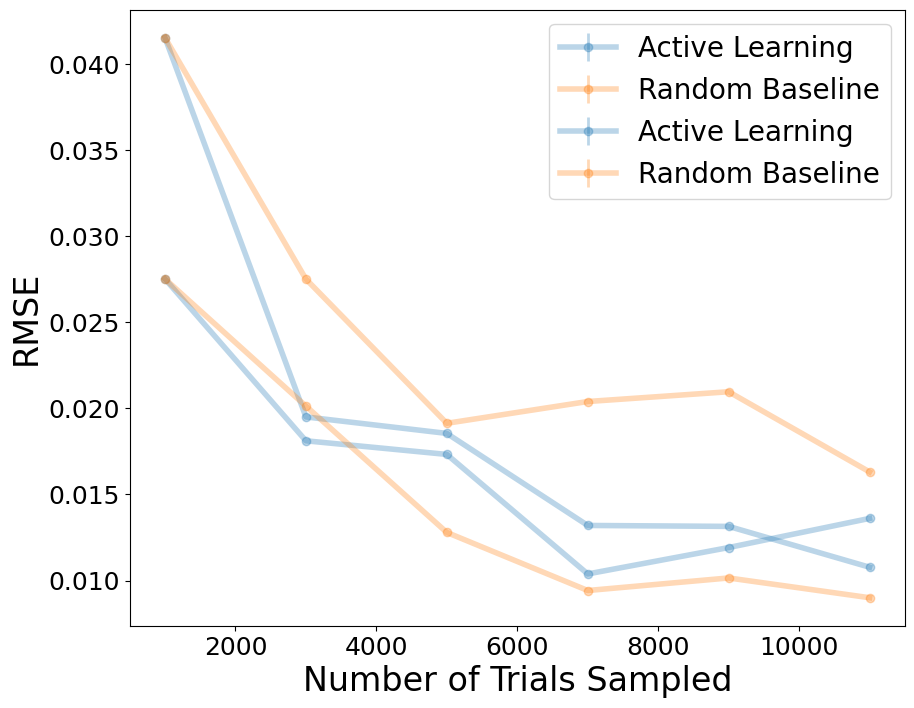

In [39]:
plt.figure(figsize=(10, 8))
plt.errorbar(np.mean(np.array(num_samples_stack), axis=0), np.mean(np.array(performance_stack_t), 0), 
             yerr=np.std(np.array(performance_stack_t), axis=0), fmt='o', ls='-', linewidth=4, elinewidth=2, label='Active Learning', c='tab:blue', alpha=0.3)
plt.errorbar(np.mean(np.array(num_samples_stack), axis=0), np.mean(np.array(performance_stack_random_t), 0), 
             yerr=np.std(np.array(performance_stack_random_t), axis=0), fmt='o', ls='-', linewidth=4, elinewidth=2, label='Random Baseline', c='tab:orange', alpha=0.3)
plt.errorbar(np.mean(np.array(num_samples_stack), axis=0), np.mean(np.array(performance_stack_nt), 0), 
             yerr=np.std(np.array(performance_stack_nt), axis=0), fmt='o', ls='-', linewidth=4, elinewidth=2, label='Active Learning', c='tab:blue', alpha=0.3)
plt.errorbar(np.mean(np.array(num_samples_stack), axis=0), np.mean(np.array(performance_stack_random_nt), 0), 
             yerr=np.std(np.array(performance_stack_random_nt), axis=0), fmt='o', ls='-', linewidth=4, elinewidth=2, label='Random Baseline', c='tab:orange', alpha=0.3)
# plt.yscale('log')
plt.xticks(fontsize=18)
plt.yticks(fontsize=18)
plt.xlabel('Number of Trials Sampled', fontsize=24)
plt.ylabel(r'RMSE', fontsize=24)
plt.legend(fontsize=20)
# plt.ylim(0.36, 0.4)

In [17]:
w_true_t, w_true_nt

(DeviceArray([[-5.697086  ,  4.945035  ,  2.81038   ,  2.7380707 ],
              [-5.697086  , -4.403379  ,  0.66156626,  2.2648323 ],
              [-5.697086  , -3.445728  , -3.3159995 , -4.123094  ]],            dtype=float32),
 DeviceArray([[-5.290783 , -0.7680973, -3.3114088, -0.93841  ],
              [-5.290783 ,  0.5586916,  2.6275876,  1.1180607]],            dtype=float32))

In [ ]:
all_combos = fitting.all_combos(np.arange(len(cells)))
ws_full = []
for i in range(len(cells)):
    ws_full.append(np.array(ws[i]))

ws_active = []
ws_active += [np.array(w_final_t)]
ws_active += [np.array(w_final_nt)]

for j in all_combos:
    combo = np.array(j)
    if len(combo) != 0 and len(combo) != len(cells):
        targets = combo
        selectivities_full.append(fitting.selectivity_triplet(ws_full, targets))
        selectivities_active.append(fitting.selectivity_triplet(ws_active, targets))
        datasets.append((dataset, wnoise, estim, p, cells, cells[targets]))

In [6]:
selectivities_full, selectivities_active

([[0.3910753848415894, 0.2565951875740619],
  [0.9874180587620681, 0.9815378040691302],
  [0.9905418850350053, 0.9673205782003332],
  [0.5099946025000682, 0.4191494190600608],
  [0.6921906707501337, 0.29602737411340757],
  [0.8212649205134332, 0.3681591805376503],
  [0.7331392770743785, 0.38663424969822385],
  [0.1845134543069454, 0.059806267847016],
  [0.8460095245123374, 0.5835152083734444],
  [0.13231121446588712, 0.07272824013980174],
  [0.36286269591996523, 0.10768053212383047],
  [0.695369428031177, 0.38583268368679285],
  [0.9250426855908588, 0.38973567565248535],
  [0.99982539213524, 0.9943999881562092],
  [0.6278196509646919, 0.47525170201011724],
  [0.906118577789734, 0.6576530334157178],
  [0.9903431784993958, 0.5006595761351733],
  [0.9971090867805815, 0.9870632527897888],
  [0.9292983084045422, 0.800006679072389],
  [0.822023430802012, 0.37447854721801904],
  [0.9892696782936669, 0.8367691941713395],
  [0.9885537613882805, 0.7646229313241594],
  [0.7885331542534015, 0.3323

In [7]:
datasets

[['2020-10-06-7',
  'kilosort_data000/data000',
  'data003/data003-all',
  1,
  array([ 84, 244]),
  array([84])],
 ['2020-10-06-7',
  'kilosort_data000/data000',
  'data003/data003-all',
  1,
  array([ 84, 244]),
  array([244])],
 ['2020-10-06-7',
  'kilosort_data000/data000',
  'data003/data003-all',
  2,
  array([259, 292]),
  array([259])],
 ['2020-10-06-7',
  'kilosort_data000/data000',
  'data003/data003-all',
  2,
  array([259, 292]),
  array([292])],
 ['2020-10-06-7',
  'kilosort_data000/data000',
  'data003/data003-all',
  3,
  array([289, 296]),
  array([289])],
 ['2020-10-06-7',
  'kilosort_data000/data000',
  'data003/data003-all',
  3,
  array([289, 296]),
  array([296])],
 ['2020-10-06-7',
  'kilosort_data000/data000',
  'data003/data003-all',
  3,
  array([289, 301]),
  array([289])],
 ['2020-10-06-7',
  'kilosort_data000/data000',
  'data003/data003-all',
  3,
  array([289, 301]),
  array([301])],
 ['2020-10-06-7',
  'kilosort_data000/data000',
  'data003/data003-all',


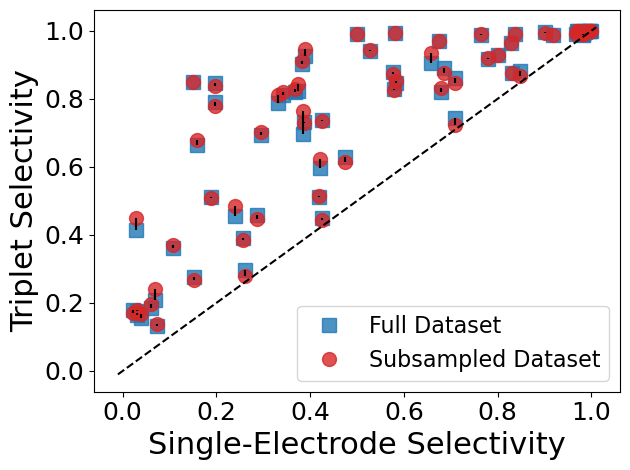

In [8]:
x = np.array(selectivities_full)[:, 1]
y = np.vstack((np.array(selectivities_full)[:, 0], np.array(selectivities_active)[:, 0])).T

lines = []
for i, j in zip(x, y):
    pair = [(i, j[0]), (i, j[1])]
    lines.append(pair)

linecoll = matcoll.LineCollection(lines, colors='k')

fig, ax = plt.subplots()
ax.plot(x, [i for (i,j) in y], 's', c='tab:blue', markersize = 10, alpha=0.8, label='Full Dataset')
ax.plot(x, [j for (i,j) in y], 'o', c='tab:red', markersize = 10, alpha=0.8, label='Subsampled Dataset')
ax.add_collection(linecoll)
ax.plot(np.linspace(-0.01, 1.01, 100), np.linspace(-0.01, 1.01, 100), linestyle='--', c='k')
ax.set_xlabel('Single-Electrode Selectivity', fontsize=22)
ax.set_ylabel('Triplet Selectivity', fontsize=22)
ax.tick_params('both', labelsize=18)
ax.legend(fontsize=16)
fig.tight_layout() # Or equivalently,  "plt.tight_layout()"
# plt.savefig('fig2_NER.png', dpi=300)

In [ ]:
# np.save('selectivities_full.npy', np.array(selectivities_full))
# np.save('selectivities_active.npy', np.array(selectivities_active))
# np.save('datasets.npy', np.array(datasets, dtype=object))